In [83]:
import pandas as pd
import numpy as np
import geopandas as gpd
import pyproj
import contextily as cx
import os
import seaborn as sns
import folium
#from rasterio.crs import CRS
import geopandas as gpd
from shapely.geometry import Point
from pyproj import Proj, transform
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import squarify
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
pyproj.datadir.set_data_dir('C:\\Users\\cegut\\.conda\\envs\\anomalias\\Library\\share\\proj')

In [84]:
os.getcwd()

'D:\\jupyter\\aprendizaje_automático\\notebooks'

In [85]:
datos = pd.read_csv("D:\\Jupyter\\aprendizaje_automático\data\\cruda\\medellin_apartamentos_venta.csv")

<>:1: SyntaxWarning:

invalid escape sequence '\d'

<>:1: SyntaxWarning:

invalid escape sequence '\d'

C:\Users\cegut\AppData\Local\Temp\ipykernel_4900\378388646.py:1: SyntaxWarning:

invalid escape sequence '\d'



In [86]:
datos.columns
len(datos.columns)

53

## Selección de variables

* price: precio del inmueble
* builtArea: Área construida
* pricePerBuiltSqm: Precio del área construida por metro cuadrado
* stratum: estrato
* isForRent: Es para arrendar
* administrationFee: Tasa de administración
* floor: piso
* isDuplex: Si el bien es Duplex
* privateArea: Área rivada del inmuble
* rooms: cantidad de cuartos
* toilets: cantidad de baños
* parkingSpaces: cantidad de parqueaderos
* hasServicesRoom: Tiene cuarto del servicio
* hasServicesToilet: Tiene baño del servicio
* hasBalcony: tiene balcón
* hasLaundryZone: tiene zona de lavandería
* hasDeposit: tiene depósito
* hasStudy: tiene estudio
* isExterior: es exterior
* hasTerrace: tiene terraza
* terraceArea: area de terraza
* elevators: cantidad de ascensores
* hasCommunalHall: tiene salón social
* hasTennisCourt: tiene cancha de tenis
* hasSoccerField: tiene campo de futbol
* hasKidsPlayZone: tiene parque infantil
* hasGreenZone: tiene zonas verdes
* isResidencialComplex: Es conjunto residencial
* hasConcierge: tiene administrador
* hasVisitorParking: tiene parqueadero para visitantes
* hasPool: tiene piscina
* age: edad del predio

In [87]:
geometry = [Point(xy) for xy in zip(datos.long, datos.lat)]

In [88]:
geodatos = gpd.GeoDataFrame(datos, geometry = geometry)

In [89]:
geodatos.crs = "EPSG:4326"

<Axes: >

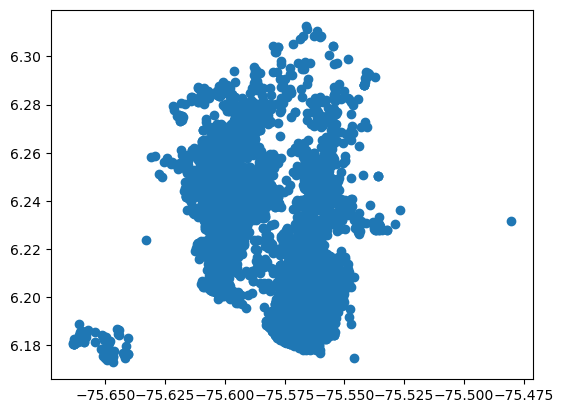

In [90]:
geodatos.plot()

In [91]:
geodatos.head()

,id,price,builtArea,pricePerBuiltSqm,stratum,location,url,name,active,isSuspicious,...,hasGreenZones,isResidentialComplex,hasConcierge,hasVisitorParking,hasPool,city_data_point,age,long,lat,geometry
0,7a8c548b-da80-4d3c-9c0f-67ab50a34d75,1450000000,280.00,5.178571e+06,6.0,0101000020E6100000BDA94885B1E352C0EA002D0208BC...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Los Balsos, Medellín",True,False,...,True,True,True,False,True,7306a24c-5b86-46a2-8cf4-c8346e943617,NaN,-75.557710,6.183624,POINT (-75.55771 6.18362)
1,1865d74c-7f78-464b-bc20-72022e14e688,225000000,54.78,4.107338e+06,4.0,0101000020E6100000E36BCF2C09E452C0622D3E05C0F8...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Bombona, Medellín",True,False,...,False,False,False,False,False,2c414e2c-33b1-4854-a6c5-e91c26bd7a2c,NaN,-75.563060,6.242920,POINT (-75.56306 6.24292)
2,003947b0-eb82-4915-a269-fdb9b0e99fec,185000000,70.00,2.642857e+06,4.0,0101000020E6100000C7293A92CBE352C0F323D97E8D07...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Prado centro , Medellín",True,False,...,False,False,False,True,False,c0c2c84d-bf89-42a9-8945-49975f3ffa8e,NaN,-75.559300,6.257376,POINT (-75.55930 6.25738)
3,0e727caa-b0c8-4cb7-80c0-6f17bb039707,410000000,90.00,4.555556e+06,5.0,0101000020E6100000F299EC9FA7E552C0317BD976DAFA...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, SAN JOAQUIN, Medellín",True,False,...,False,False,False,False,False,81f9659c-4144-447f-8173-4a6124aef008,NaN,-75.588356,6.244974,POINT (-75.58836 6.24497)
4,2620318f-415f-412d-8430-0f71c1afe436,300000000,80.00,3.750000e+06,1.0,0101000020E610000040A4DFBE0EE752C07023658BA4DD...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, BELEN, Medellín",False,False,...,False,False,False,False,False,17c77960-c6db-419f-b627-d747996c5be8,NaN,-75.610275,6.216448,POINT (-75.61028 6.21645)


In [92]:
geodatos.columns

Index(['id', 'price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'location',
       'url', 'name', 'active', 'isSuspicious', 'isForRent', 'updatedAt',
       'createdAt', 'deactivatedAt', 'administrationFee', 'floor', 'isDuplex',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'hasServiceRoom',
       'hasServiceToilet', 'hasBalcony', 'hasLaundryZone', 'hasDeposit',
       'hasStudy', 'isExterior', 'hasTerrace', 'terraceArea', 'ageId',
       'listingSourceId', 'neighborhoodId', 'cityId', 'parkingTypeId',
       'elevators', 'bogotaDataPointId', 'listingCode', 'descriptionText',
       'listingJSON', 'hasCommunalHall', 'hasTennisCourt', 'hasSoccerField',
       'hasKidsPlayZone', 'hasGreenZones', 'isResidentialComplex',
       'hasConcierge', 'hasVisitorParking', 'hasPool', 'city_data_point',
       'age', 'long', 'lat', 'geometry'],
      dtype='object')

In [93]:
# Primero se eliminan LAS COLUMNAS en los que todas sus variables son nulas
geodatos = geodatos.dropna(axis = 1, how = "all")

# Luego se eliminan los registros en los que todas sus variables son nulas
geodatos = geodatos.dropna( how = 'all').copy()

In [94]:
geodatos.shape

(9883, 51)

In [95]:
len(geodatos.columns)
geodatos.columns

Index(['id', 'price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'location',
       'url', 'name', 'active', 'isSuspicious', 'isForRent', 'updatedAt',
       'createdAt', 'deactivatedAt', 'administrationFee', 'floor', 'isDuplex',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'hasServiceRoom',
       'hasServiceToilet', 'hasBalcony', 'hasLaundryZone', 'hasDeposit',
       'hasStudy', 'isExterior', 'hasTerrace', 'terraceArea', 'ageId',
       'listingSourceId', 'cityId', 'parkingTypeId', 'elevators',
       'listingCode', 'descriptionText', 'listingJSON', 'hasCommunalHall',
       'hasTennisCourt', 'hasSoccerField', 'hasKidsPlayZone', 'hasGreenZones',
       'isResidentialComplex', 'hasConcierge', 'hasVisitorParking', 'hasPool',
       'city_data_point', 'long', 'lat', 'geometry'],
      dtype='object')

In [96]:
geodatos[['price', 'pricePerBuiltSqm', 'isDuplex', 'hasServiceToilet']].head()

,price,pricePerBuiltSqm,isDuplex,hasServiceToilet
0,1450000000,5.178571e+06,False,False
1,225000000,4.107338e+06,False,False
2,185000000,2.642857e+06,False,False
3,410000000,4.555556e+06,False,False
4,300000000,3.750000e+06,False,False


In [97]:
geodatos['stratum'].unique()

array([ 6.,  4.,  5.,  1.,  3., nan,  2.])

In [98]:
nulos_variables = pd.DataFrame(geodatos.isnull().sum())
print(nulos_variables)

                         0
id                       0
price                    0
builtArea                0
pricePerBuiltSqm         0
stratum                220
location                 0
url                      0
name                     0
active                   0
isSuspicious             0
isForRent                0
updatedAt                0
createdAt                0
deactivatedAt         7740
administrationFee     3732
floor                 3920
isDuplex                 0
privateArea            507
rooms                    0
toilets                  0
parkingSpaces         1312
hasServiceRoom           0
hasServiceToilet         0
hasBalcony               0
hasLaundryZone           0
hasDeposit               0
hasStudy                 0
isExterior               0
hasTerrace               0
terraceArea           9531
ageId                    0
listingSourceId          0
cityId                   0
parkingTypeId         5314
elevators             3325
listingCode              0
d

In [99]:
# Verificando que no existan valores nulos en el dataset
print(f"¿Existen valores nulos?: {geodatos.isnull().values.any()}. ¿Cuántos valores nulos hay?: {geodatos.isnull().sum().sum()}")

¿Existen valores nulos?: True. ¿Cuántos valores nulos hay?: 35806


In [100]:
# fig, ax = plt.subplots(3, 3, figsize = (20, 10))

# ax[0, 0].pie(geodatos['isDuplex'].value_counts())

# ax[0, 1].pie(geodatos['hasServiceRoom'].value_counts())

# ax[1, 1].pie(geodatos['hasServiceToilet'].value_counts())

# ax[1, 0].pie(geodatos['hasBalcony'].value_counts())

# ax[2, 0].pie(geodatos['hasLaundryZone'].value_counts())

# ax[2, 1].pie(geodatos['hasDeposit'].value_counts())

# ax[2, 2].pie(geodatos['hasStudy'].value_counts())

# ax[0, 2].pie(geodatos['isExterior'].value_counts())

# ax[1, 2].pie(geodatos['hasTerrace'].value_counts())

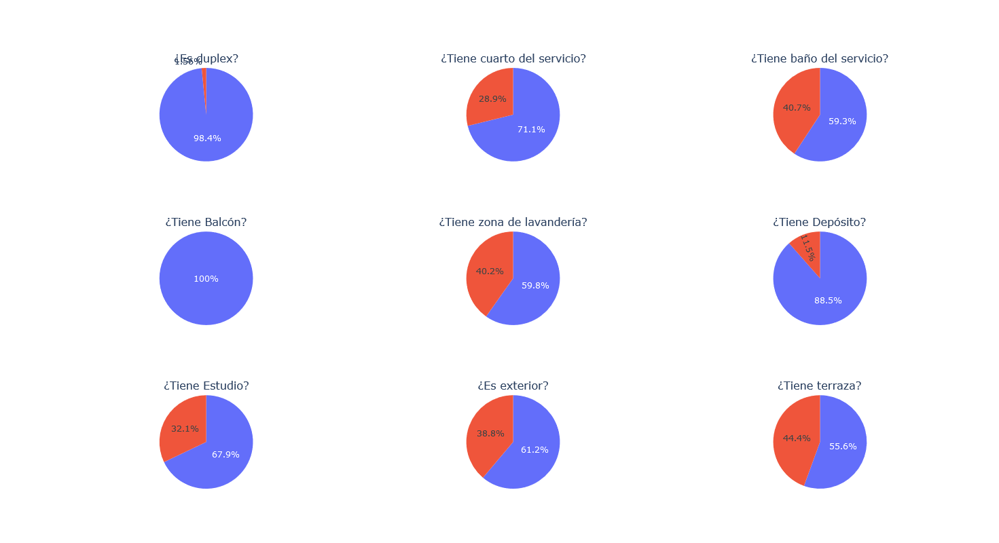

In [101]:
fig = make_subplots(rows = 3, cols = 3, specs = [[{'type': 'pie'}, {'type': 'pie'}, {'type': 'pie'}], 
                                                 [{'type': 'pie'}, {'type': 'pie'}, {'type': 'pie'}],
                                                 [{'type': 'pie'}, {'type': 'pie'}, {'type': 'pie'}]],  
                    subplot_titles = ('¿Es duplex?', 
                                      '¿Tiene cuarto del servicio?', 
                                      '¿Tiene baño del servicio?', 
                                      '¿Tiene Balcón?', 
                                      '¿Tiene zona de lavandería?', 
                                      '¿Tiene Depósito?', 
                                      '¿Tiene Estudio?', 
                                      '¿Es exterior?', 
                                      '¿Tiene terraza?'))

fig.add_trace(go.Pie(values = geodatos['isDuplex'].value_counts()), row = 1, col = 1)
fig.add_trace(go.Pie(values = geodatos['hasServiceRoom'].value_counts()), row = 1, col = 2)
fig.add_trace(go.Pie(values = geodatos['hasServiceToilet'].value_counts()), row = 2, col = 1)
fig.add_trace(go.Pie(values = geodatos['hasBalcony'].value_counts()), row = 2, col = 2)
fig.add_trace(go.Pie(values = geodatos['hasLaundryZone'].value_counts()), row = 3, col = 1)
fig.add_trace(go.Pie(values = geodatos['hasDeposit'].value_counts()), row = 3, col = 2)
fig.add_trace(go.Pie(values = geodatos['hasStudy'].value_counts()), row = 3, col = 3)
fig.add_trace(go.Pie(values = geodatos['isExterior'].value_counts()), row = 1, col = 3)
fig.add_trace(go.Pie(values = geodatos['hasTerrace'].value_counts()), row = 2, col = 3)

fig.update_layout(height = 800, showlegend = False)
fig.show()

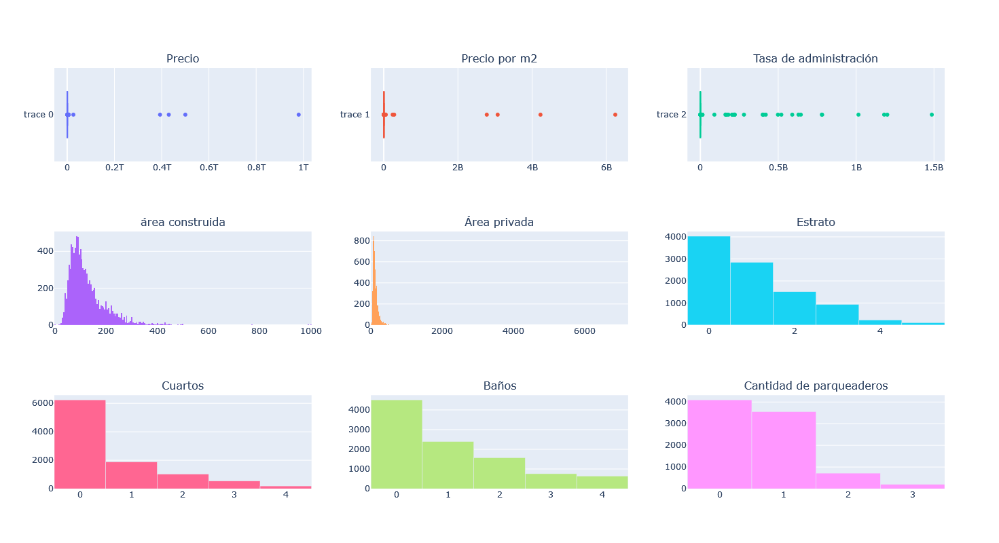

In [102]:
fig = make_subplots(
    rows = 3, cols = 3,
    specs = [[{}, {}, {}],
            [{}, {}, {}],
            [{}, {}, {}]],
    subplot_titles = ('Precio', 'Precio por m2', 'Tasa de administración', 
                      'área construida', 'Área privada', 'Estrato', 
                      'Cuartos', 'Baños', 'Cantidad de parqueaderos'))

fig.add_trace(go.Box(x = geodatos['price']), row = 1, col = 1)
fig.add_trace(go.Box(x = geodatos['pricePerBuiltSqm']), row = 1, col = 2)
fig.add_trace(go.Box(x = geodatos['administrationFee']), row = 1, col = 3)
fig.add_trace(go.Histogram(x = geodatos['builtArea']), row = 2, col = 1)
fig.add_trace(go.Histogram(x = geodatos['privateArea']), row = 2, col = 2)
fig.add_trace(go.Bar(y = geodatos['stratum'].value_counts()), row = 2, col = 3)
fig.add_trace(go.Bar(y = geodatos['rooms'].value_counts()), row = 3, col = 1)
fig.add_trace(go.Bar(y = geodatos['toilets'].value_counts()), row = 3, col = 2)
fig.add_trace(go.Bar(y = geodatos['parkingSpaces'].value_counts()), row = 3, col = 3)

fig.update_layout(height = 800, showlegend = False)

In [103]:
geodatos['rooms'].shape

(9883,)

In [104]:
geodatos[geodatos['price'] > 60000000000].head(10)

,id,price,builtArea,pricePerBuiltSqm,stratum,location,url,name,active,isSuspicious,...,hasKidsPlayZone,hasGreenZones,isResidentialComplex,hasConcierge,hasVisitorParking,hasPool,city_data_point,long,lat,geometry
3055,53edc5d5-4254-41d5-a463-8e31d2fa8e1e,430000000000,140.0,3.071429e+09,5.0,0101000020E6100000D46531B1F9E452C038E27FE14BF7...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Conquistadores, Medellín",True,True,...,False,False,True,False,False,False,84968e9d-159e-4ed0-a727-f5bd8e806f46,-75.57774,6.241500,POINT (-75.57774 6.24150)
5418,92a073e8-2031-4ce1-9560-036cd54ed18d,500000000000,180.0,2.777778e+09,4.0,0101000020E6100000DF6C73637AE652C0BC4049810508...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, LA FLORESTA, Medellín",True,True,...,False,False,True,False,False,False,dcea624c-dd8b-4466-849a-530b259bd9a4,-75.60122,6.257834,POINT (-75.60122 6.25783)
5800,9d4e58ae-fece-477c-ae1a-d877accc1ece,980000000000,157.0,6.242038e+09,5.0,0101000020E6100000601F9DBAF2E352C073124A5F08D1...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, LA FLORIDA, Medellín",False,True,...,True,True,True,True,False,True,1fc58bfe-bce0-4698-bc89-c0e86b5ebb0e,-75.56169,6.204134,POINT (-75.56169 6.20413)
6396,ac936d8d-b907-4f38-a78a-160d18f2871f,393000000000,93.0,4.225806e+09,5.0,0101000020E6100000462575029AE652C0A19C0D9EAEEB...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, BELEN, Medellín",True,True,...,False,False,True,False,False,False,3c68d3ed-751b-4538-b157-1a39a7d4fb91,-75.60315,6.230158,POINT (-75.60315 6.23016)


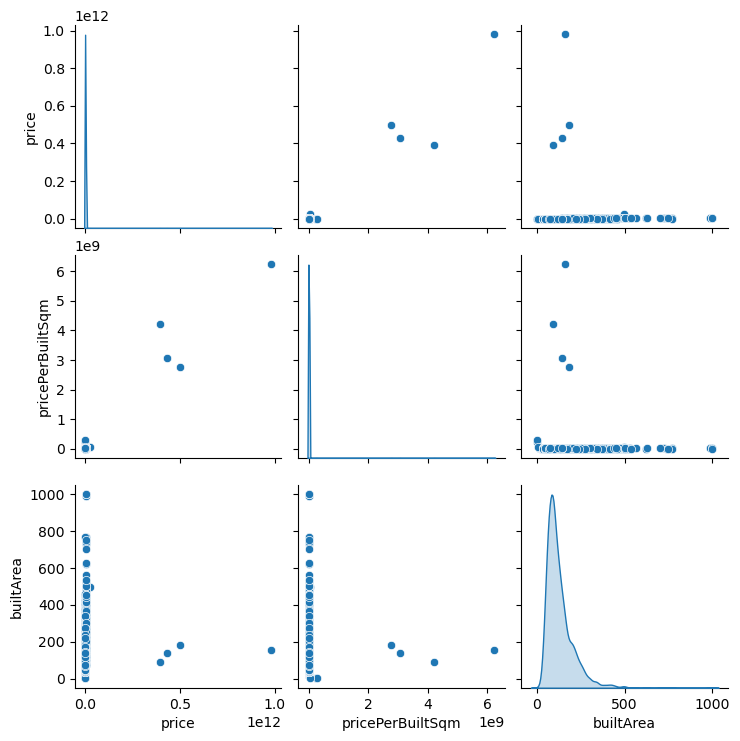

In [105]:
sns.pairplot(geodatos[['price', 'pricePerBuiltSqm', 'builtArea']], diag_kind = 'kde')
plt.show()

In [106]:
estrato_cuartos = pd.crosstab(geodatos['stratum'], 
                              geodatos['rooms'], 
                              colnames = ['Num. Cuartos'], 
                              rownames = ['Estrato'])

estrato_baños = pd.crosstab(geodatos['stratum'], 
                            geodatos['toilets'], 
                            colnames = ['Num. Baños'], 
                            rownames = ['Estrato'])

estrato_parqueaderos = pd.crosstab(geodatos['stratum'], 
                                   geodatos['parkingSpaces'], 
                                   colnames = ['Num. parqueaderos'], 
                                   rownames = ['Estrato'])

<Axes: xlabel='Num. parqueaderos', ylabel='Estrato'>

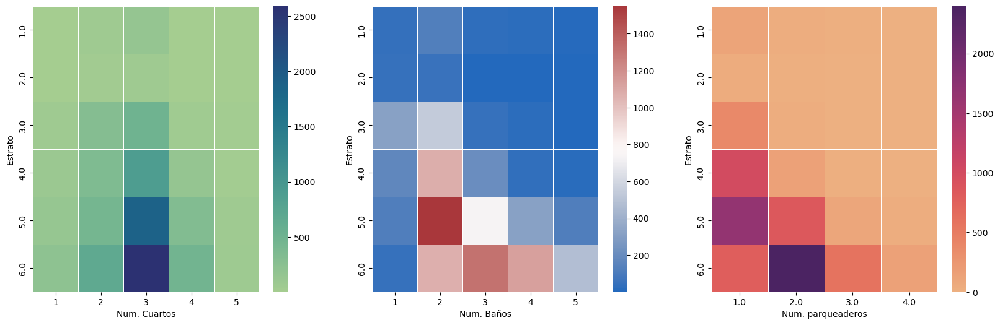

In [107]:
fig, ax = plt.subplots(1, 3, figsize = (20,6))

sns.heatmap(estrato_cuartos, linewidths = 0.5, linecolor = 'white', ax = ax[0], cmap = 'crest')


sns.heatmap(estrato_baños, linewidths = 0.5, linecolor = 'white', ax = ax[1], cmap = 'vlag')

sns.heatmap(estrato_parqueaderos, linewidths = 0.5, linecolor = 'white', ax = ax[2], cmap = 'flare')

In [108]:
# # initialise
# #map = Basemap(llcrnrlon = -79, llcrnrlat = -4, urcrnrlon = -66, urcrnrlat = 12, resolution='i', projection='merc')
# plt.rcParams["figure.figsize"] = 15,15

# #map = Basemap(llcrnrlon = -75.9, llcrnrlat = 6.35, urcrnrlon = -75.3, urcrnrlat = 6.15, resolution='i')
# #map.bluemarble()

# map = Basemap(width=12000000,height=9000000,projection='lcc',
#             resolution = None, lat_1 = 6.15, lat_2 = 6.35, lat_0 = 4, lon_0 = -72)
# map.shadedrelief()

# # background color
# #map.drawmapboundary(fill_color='#A6CAE0', color="black")

# # country color
# #map.fillcontinents(color='#e6b800',lake_color='#A6CAE0')
# map.drawcountries(color='grey', linewidth=1)

# # Show states
# map.drawstates(color='lightgrey', linewidth=1)
# map.drawrivers()

# map.scatter(x = geodatos['long'], y = geodatos['lat'], s = geodatos['price']/1000000000, alpha = 0.4)



# plt.show()

In [109]:
n = folium.Map(location = [6, -74], tiles = "OpenStreetMap", zoom_start = 10)

for punto in geodatos.itertuples():
    folium.CircleMarker(
        location = [punto.lat, punto.long],
        popup = punto.price,
        radius = float(punto.builtArea/100),
        color = '#69b3a2',
        #fill = True,
        fill_color = '#69b3a2'
   ).add_to(n)

# A title can be added to the map, if desired.
n.get_root().html.add_child(folium.Element("<h3 align='center'>Mapa ventas de inmuebles Medellín</h3>"))
n

In [110]:
#n.save('D:\\jupyter\\aprendizaje_automático\\imagenes\\mapa.html')

In [111]:
#geodatos.to_file('D:\\jupyter\\aprendizaje_automático\\data\\intermedia\\datos_geojson.geojson', driver = 'GeoJSON')

## Limpieza de la base y selección de variables

In [112]:
# Eliminando los valores atípicos
indices_atipicos_precio = geodatos.nlargest(5, 'price').index
geodatos = geodatos.drop(indices_atipicos_precio)

In [113]:
indices_atipicos_preciom2 = geodatos.nlargest(5, 'pricePerBuiltSqm').index
geodatos = geodatos.drop(indices_atipicos_preciom2)

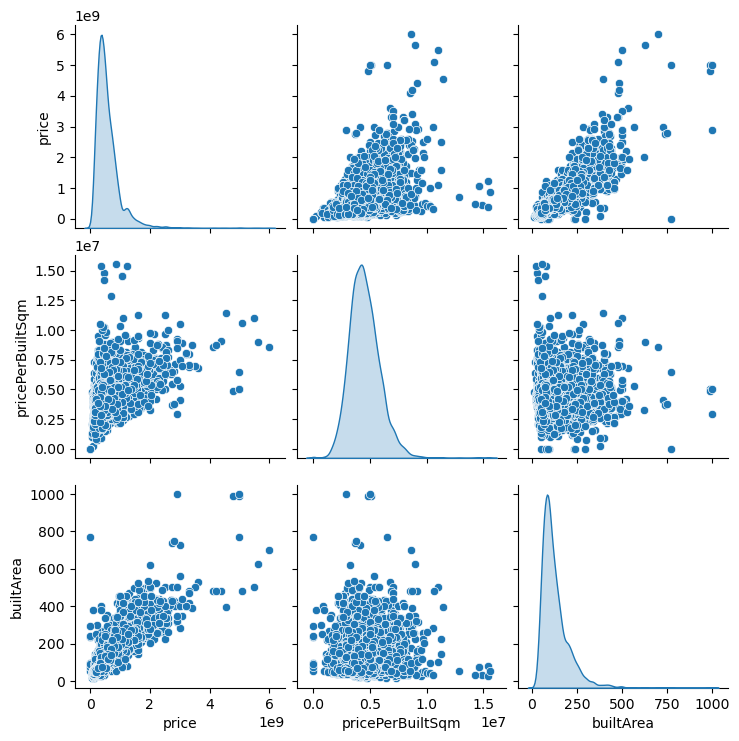

In [114]:
sns.pairplot(geodatos[['price', 'pricePerBuiltSqm', 'builtArea']], diag_kind = 'kde')
plt.show()

In [115]:
## Selección de variables finales para el modelo. Se eliminan las variables que no son de interés en el modelo porque provienene de webscraping y se eliminan las variables
## balcony porque todas las respuestas fueron negativas.

eliminar_columnas = ['location', 'url', 'name', 'active', 'isSuspicious', 
                     'isForRent','updatedAt', 'createdAt', 'deactivatedAt', 
                     'hasBalcony', 'ageId', 'listingSourceId', 'cityId', 
                     'parkingTypeId', 'elevators',  'listingCode', 'descriptionText', 
                     'listingJSON','city_data_point']
geodatos = geodatos.drop(eliminar_columnas, axis = 1)

In [117]:
geodatos.columns
geodatos.dtypes

id                        object
price                      int64
builtArea                float64
pricePerBuiltSqm         float64
stratum                  float64
administrationFee        float64
floor                    float64
isDuplex                    bool
privateArea              float64
rooms                      int64
toilets                    int64
parkingSpaces            float64
hasServiceRoom              bool
hasServiceToilet            bool
hasLaundryZone              bool
hasDeposit                  bool
hasStudy                    bool
isExterior                  bool
hasTerrace                  bool
terraceArea              float64
hasCommunalHall             bool
hasTennisCourt              bool
hasSoccerField              bool
hasKidsPlayZone             bool
hasGreenZones               bool
isResidentialComplex        bool
hasConcierge                bool
hasVisitorParking           bool
hasPool                     bool
long                     float64
lat       

In [118]:
## Para los valores nulos se verifica qué porcentaje de datos por cada variable es nula para imputarla o eliminarla por completo
nulos_variables = pd.DataFrame(geodatos.isnull().sum())
print(nulos_variables)

                         0
id                       0
price                    0
builtArea                0
pricePerBuiltSqm         0
stratum                220
administrationFee     3726
floor                 3917
isDuplex                 0
privateArea            507
rooms                    0
toilets                  0
parkingSpaces         1310
hasServiceRoom           0
hasServiceToilet         0
hasLaundryZone           0
hasDeposit               0
hasStudy                 0
isExterior               0
hasTerrace               0
terraceArea           9521
hasCommunalHall          0
hasTennisCourt           0
hasSoccerField           0
hasKidsPlayZone          0
hasGreenZones            0
isResidentialComplex     0
hasConcierge             0
hasVisitorParking        0
hasPool                  0
long                     0
lat                      0
geometry                 0


In [119]:
nulos_variables['porcentaje'] = (nulos_variables.iloc[:,0] / geodatos.shape[0]) * 100

In [120]:
nulos_variables.head(50)

,0,porcentaje
id,0,0.000000
price,0,0.000000
builtArea,0,0.000000
pricePerBuiltSqm,0,0.000000
stratum,220,2.228299
administrationFee,3726,37.739289
floor,3917,39.673858
isDuplex,0,0.000000
privateArea,507,5.135217
rooms,0,0.000000


In [121]:
### Con base en los resultados anteriores, se elimina la variable: terraceArea, geometry
geodatos = geodatos.drop(columns = ['terraceArea', 'geometry'])

In [122]:
## Se hace una copia del DataFrame para poder imputar los valores nulos.
geodatos2 = geodatos.copy()

In [123]:
# Se observa que quedan 31 variables y 9873 registros. Cuando originalmente se tenían 98883
geodatos2.shape

(9873, 30)

In [124]:
## Para los valores nulos se imputan a partir del promedio de las variables por columna se debe tener en cuenta el tipo de dato.
col_numericas = geodatos.select_dtypes(include = ['float', 'int']).columns
col_categoricas = geodatos.select_dtypes(include = ['object']).columns
col_booleanos = geodatos.select_dtypes(include = ['bool']).columns

promedio_numericas = geodatos[col_numericas].mean()
promedio_categoricas = geodatos[col_categoricas].mode().iloc[0]
promedio_booleanos = geodatos[col_booleanos].mode().iloc[0]

geodatos2[col_numericas] = geodatos[col_numericas].fillna(promedio_numericas)
geodatos2[col_categoricas] = geodatos[col_categoricas].fillna(promedio_categoricas)
geodatos2[col_booleanos] = geodatos[col_booleanos].fillna(promedio_booleanos)

In [125]:
# Verificando que no existan valores nulos
nulos_variables = geodatos2.isnull().sum()
print(nulos_variables)

id                      0
price                   0
builtArea               0
pricePerBuiltSqm        0
stratum                 0
administrationFee       0
floor                   0
isDuplex                0
privateArea             0
rooms                   0
toilets                 0
parkingSpaces           0
hasServiceRoom          0
hasServiceToilet        0
hasLaundryZone          0
hasDeposit              0
hasStudy                0
isExterior              0
hasTerrace              0
hasCommunalHall         0
hasTennisCourt          0
hasSoccerField          0
hasKidsPlayZone         0
hasGreenZones           0
isResidentialComplex    0
hasConcierge            0
hasVisitorParking       0
hasPool                 0
long                    0
lat                     0
dtype: int64


In [126]:
## Finalmente se convierten las variables booleanas a valores de 0 y 1 para las columnas que tienen este tipo de dato

columnas_booleanas = geodatos2.select_dtypes(include = bool).columns.tolist()
geodatos2[columnas_booleanas] = geodatos2[columnas_booleanas].astype(int)

In [127]:
geodatos2.dtypes

id                       object
price                     int64
builtArea               float64
pricePerBuiltSqm        float64
stratum                 float64
administrationFee       float64
floor                   float64
isDuplex                  int32
privateArea             float64
rooms                     int64
toilets                   int64
parkingSpaces           float64
hasServiceRoom            int32
hasServiceToilet          int32
hasLaundryZone            int32
hasDeposit                int32
hasStudy                  int32
isExterior                int32
hasTerrace                int32
hasCommunalHall           int32
hasTennisCourt            int32
hasSoccerField            int32
hasKidsPlayZone           int32
hasGreenZones             int32
isResidentialComplex      int32
hasConcierge              int32
hasVisitorParking         int32
hasPool                   int32
long                    float64
lat                     float64
dtype: object

In [128]:
geodatos.to_csv('D:\\Jupyter\\aprendizaje_automático\\data\\intermedia\\base_limpia.csv')